<a href="https://colab.research.google.com/github/FadyMamdouh01/CompVission/blob/main/FacerecognitionProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install face_recognition

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
!pip install dlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [5]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import data, exposure
import cv2
import face_recognition

import dlib
import os
from sklearn.model_selection import train_test_split

In [6]:
# Set up the paths to the data
data_dir = "/content/drive/MyDrive/faces/faces"
photos = []
for dirname, _, filenames in os.walk(data_dir):
    for filename in filenames:
        if filename.endswith('.jpg') or filename.endswith('.png'):
            photo = os.path.join(dirname, filename)
            photos.append(photo)

In [7]:
# Split the data into training and testing sets
train_photos, test_photos = train_test_split(photos, test_size=0.2, random_state=42)

<ipython-input-8-4d16de629d48>:12: FutureWarning: `multichannel` is a deprecated argument name for `hog`. It will be removed in version 1.0. Please use `channel_axis` instead.
  fd, hog_image = hog(image, orientations=8, pixels_per_cell=(16, 16), cells_per_block=(1,1), visualize=True, multichannel=True)


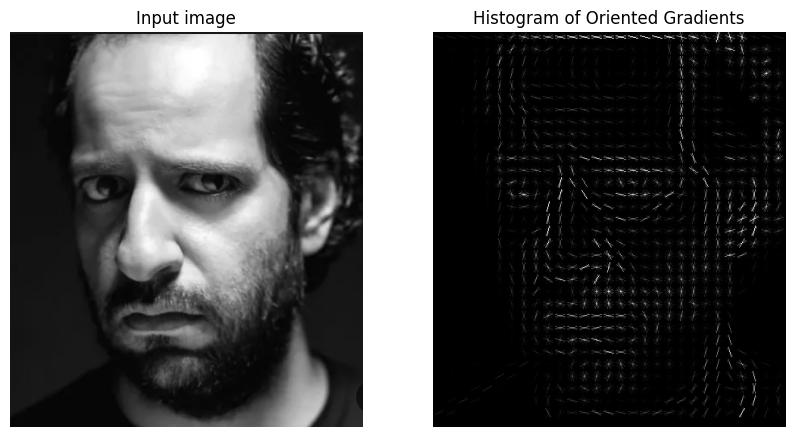

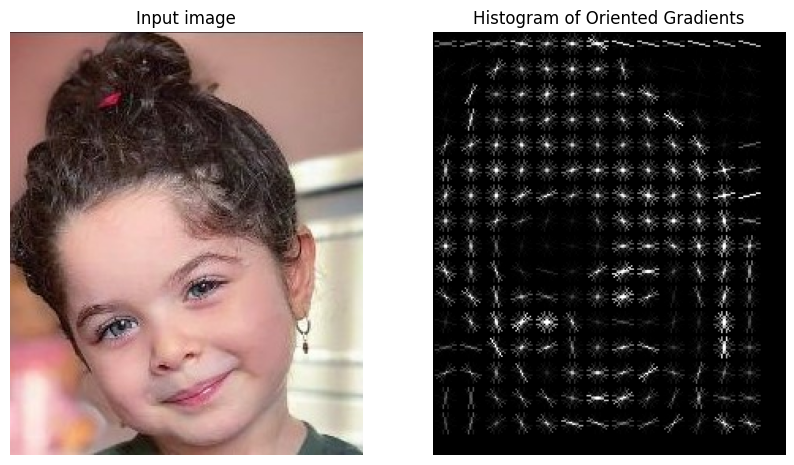

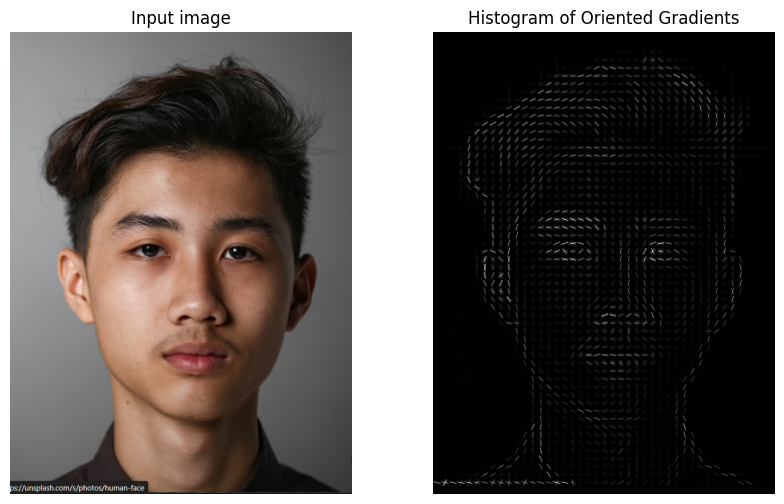

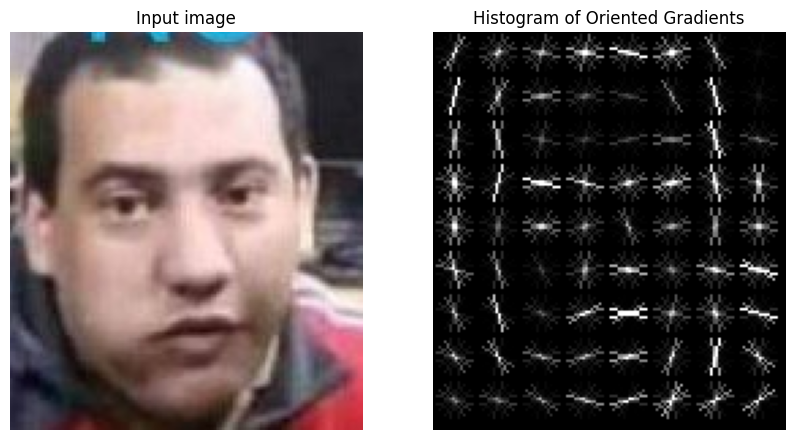

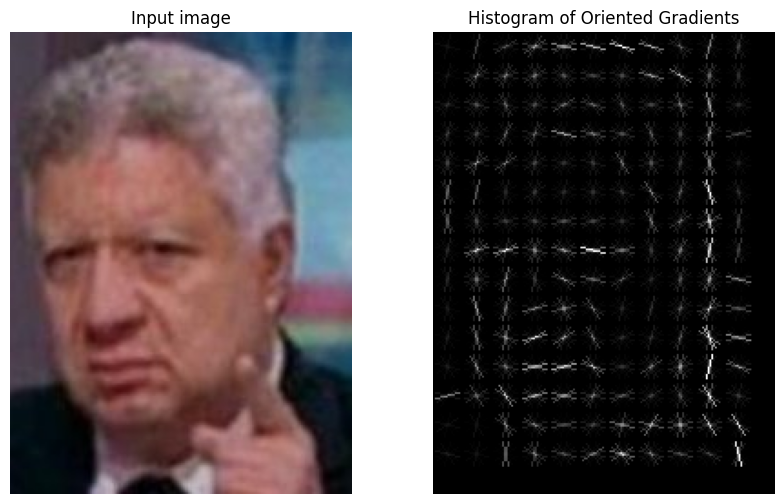

...

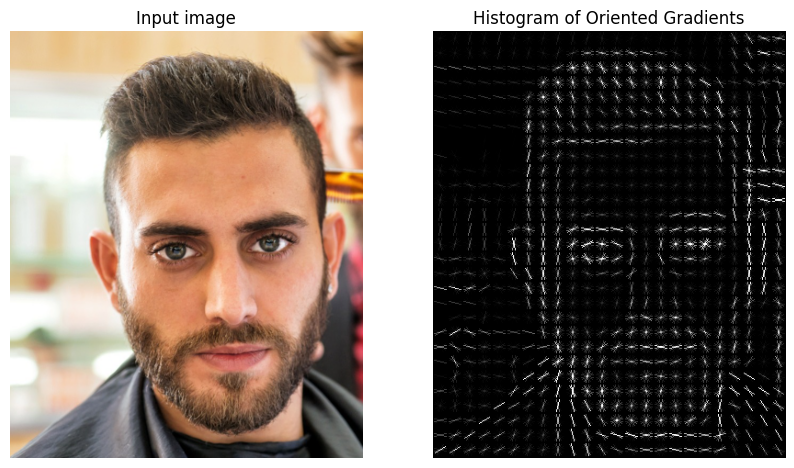

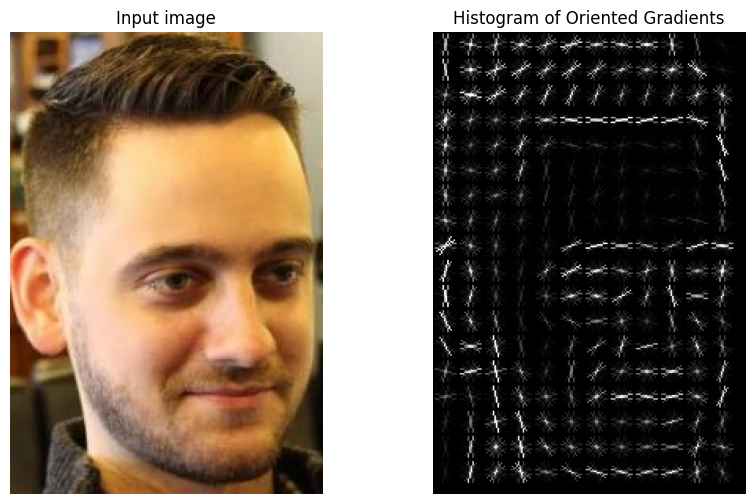

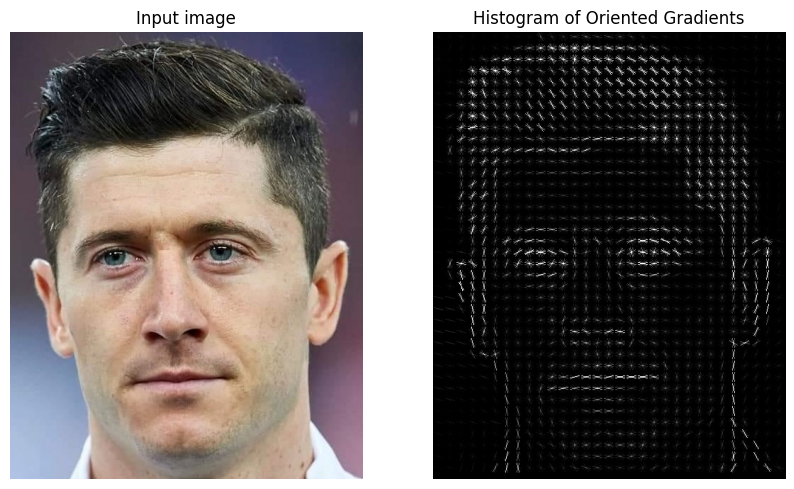

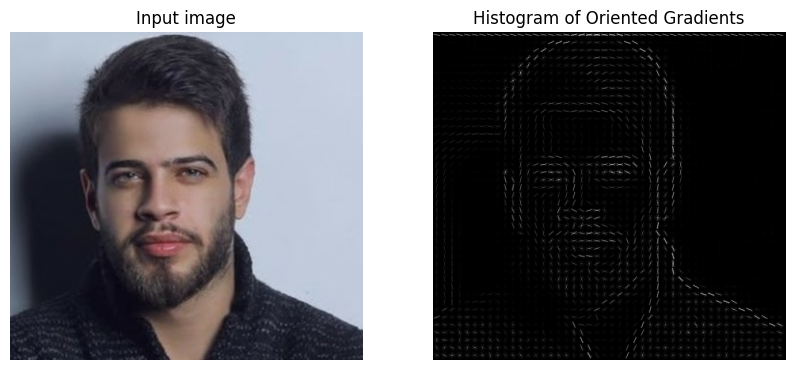

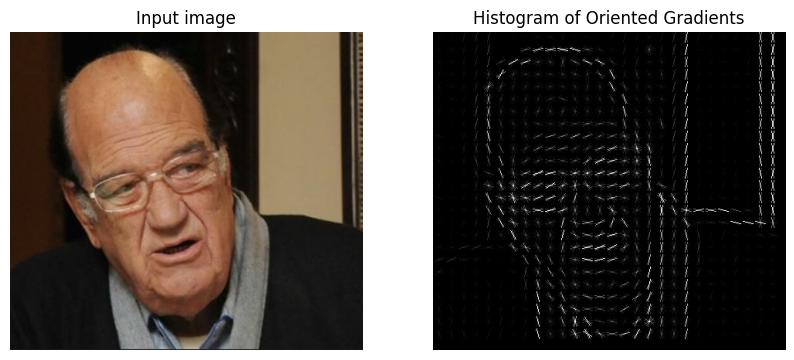

In [8]:
# Process the training set
for photo in train_photos:
    # read the image file
    image = cv2.imread(photo)
    if image is None:
        print(f"Failed to read image file: {photo}")
        continue
    # convert to RGB color space
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
    
    # compute HOG features
    fd, hog_image = hog(image, orientations=8, pixels_per_cell=(16, 16), cells_per_block=(1,1), visualize=True, multichannel=True)
    
    # plot input image and HOG image 
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,6), sharex=True, sharey=True)
    ax1.axis("off")
    ax1.imshow(image, cmap=plt.cm.gray)
    ax1.set_title("Input image")

    # rescaling for better display
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0,15))

    ax2.axis("off")
    ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
    ax2.set_title("Histogram of Oriented Gradients")
    plt.show()


<ipython-input-9-d47be2d36b10>:13: FutureWarning: `multichannel` is a deprecated argument name for `hog`. It will be removed in version 1.0. Please use `channel_axis` instead.
  fd, hog_image = hog(image, orientations=8, pixels_per_cell=(16, 16), cells_per_block=(1,1), visualize=True, multichannel=True)


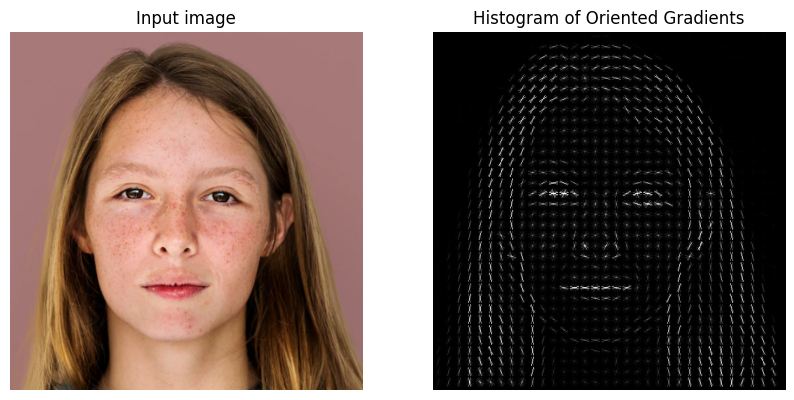

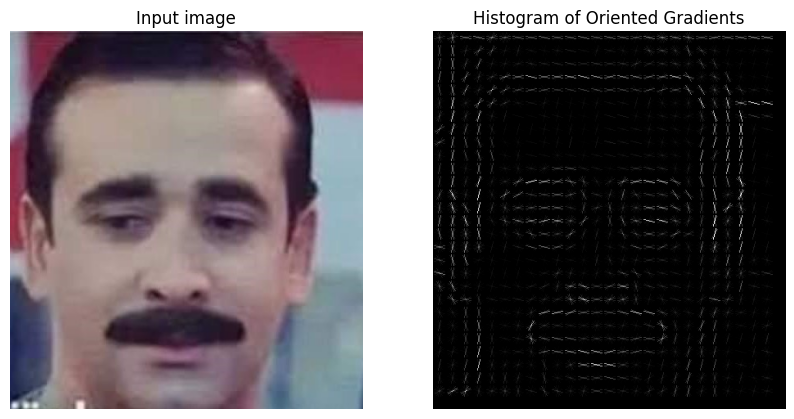

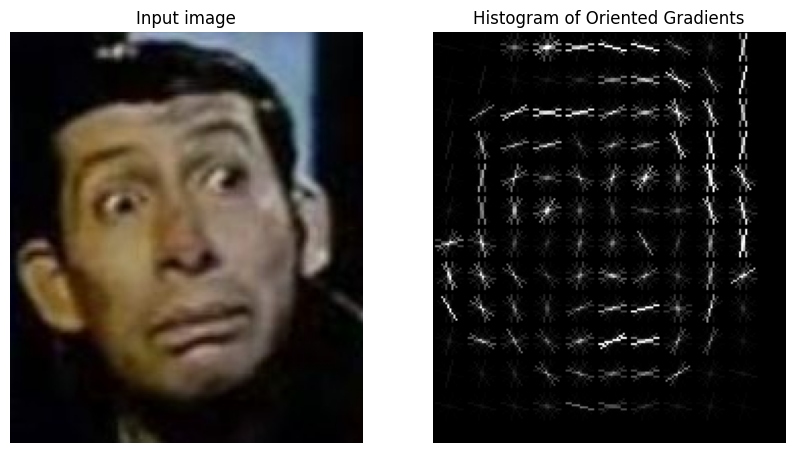

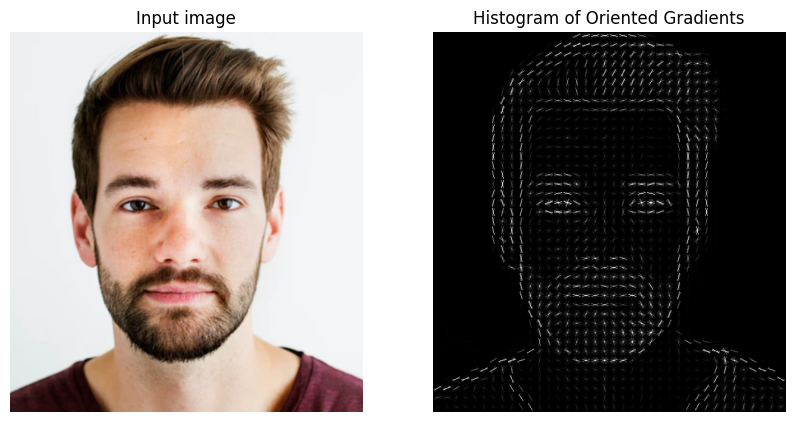

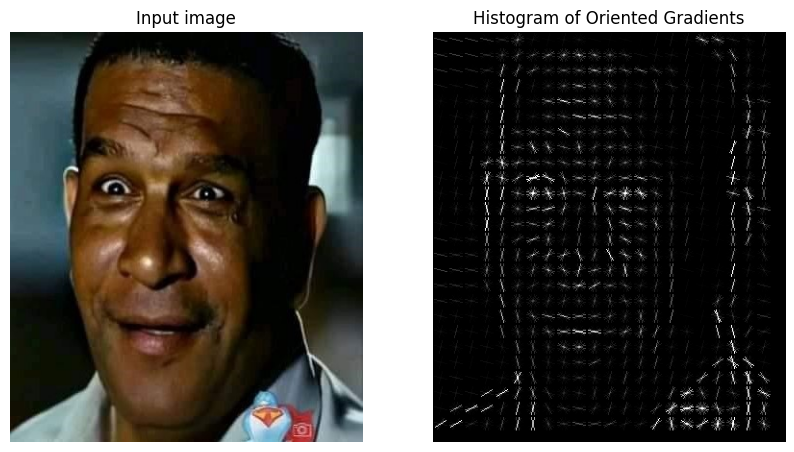

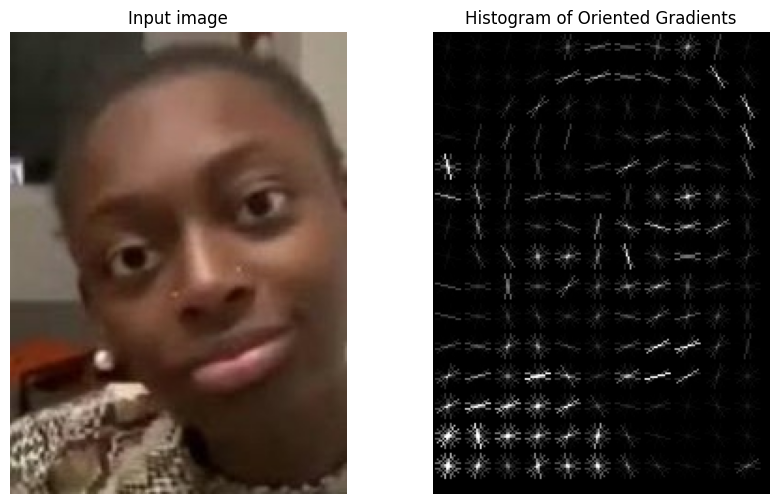

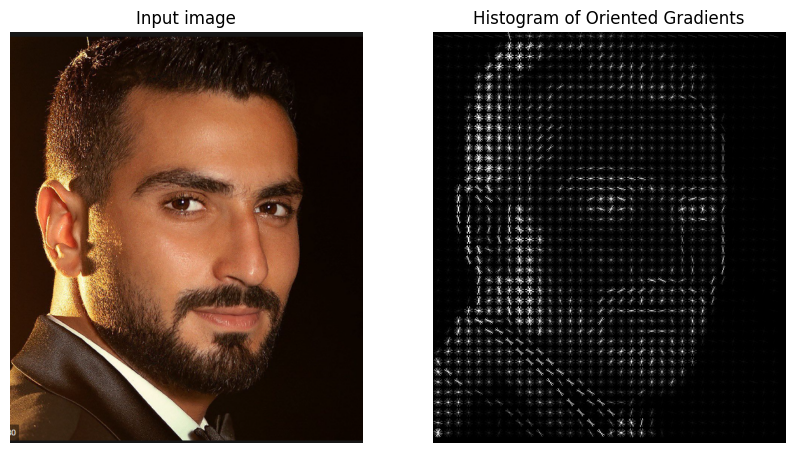

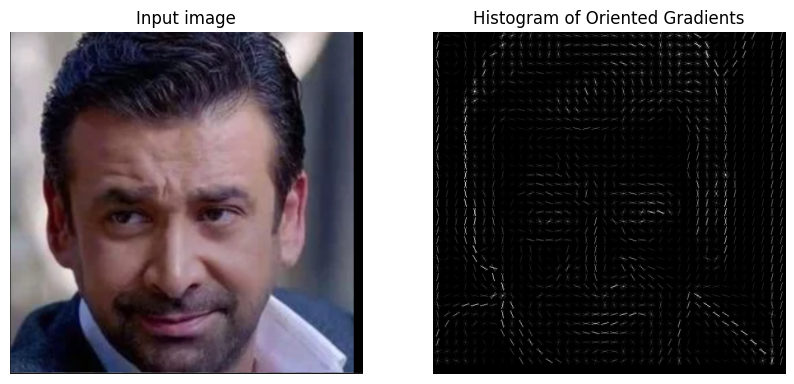

In [9]:
# Process the testing set
for photo in test_photos:
    # read the image file
    image = cv2.imread(photo)
    if image is None:
        print(f"Failed to read image file: {photo}")
        continue
    
    # convert to RGB color space
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
    
    # compute HOG features
    fd, hog_image = hog(image, orientations=8, pixels_per_cell=(16, 16), cells_per_block=(1,1), visualize=True, multichannel=True)
    
    # plot input image and HOG image 
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,6), sharex=True, sharey=True)
    ax1.axis("off")
    ax1.imshow(image, cmap=plt.cm.gray)
    ax1.set_title("Input image")

    # rescaling for better display
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0,15))

    ax2.axis("off")
    ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
    ax2.set_title("Histogram of Oriented Gradients")
    plt.show()

In [10]:
# compare the dimension of HOG image and the original image
print(f"Image shape: {image.shape}, HOG shape: {hog_image.shape}, Number of HOG features: {len(fd)}")


Image shape: (591, 608, 3), HOG shape: (591, 608), Number of HOG features: 10944


In [11]:
# Print the number of images int he training and testing sets
print(f"Number of images in the training set: {len(train_photos)}")
print(f"Number of images in the testing set: {len(test_photos)}")

Number of images in the training set: 32
Number of images in the testing set: 8


In [12]:
face_landmarks_list = face_recognition.face_landmarks(image)

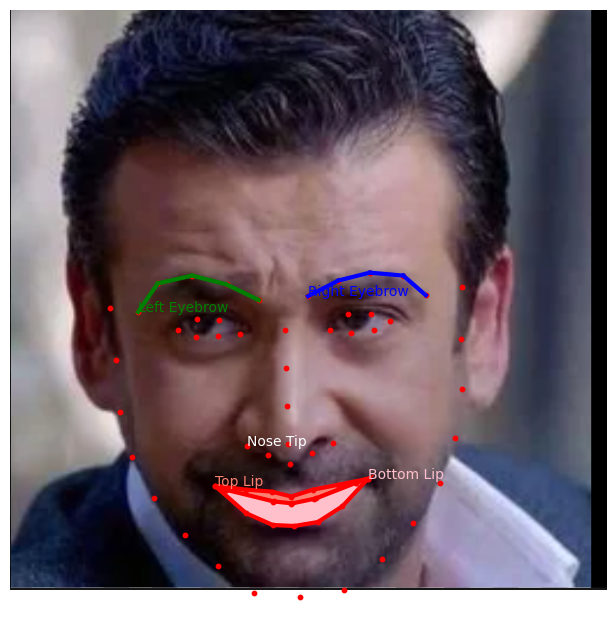

In [13]:
import matplotlib.lines as mlines
from matplotlib.patches import Polygon
import matplotlib.pyplot as plt

import matplotlib.lines as mlines
from matplotlib.patches import Polygon
import matplotlib.pyplot as plt

# increase the figure size for better visibility
plt.figure(figsize=(8, 8))
plt.imshow(image)

ax = plt.gca()

for face_landmarks in face_landmarks_list:
    # draw the left eyebrow
    left_eyebrow_pts = face_landmarks['left_eyebrow']
    pre_x, pre_y = left_eyebrow_pts[0]
    for (x, y) in left_eyebrow_pts[1:]:
        l = mlines.Line2D([pre_x, x], [pre_y, y], color="green", linewidth=3)
        ax.add_line(l)
        pre_x, pre_y = x, y

    # draw the right eyebrow
    right_eyebrow_pts = face_landmarks['right_eyebrow']
    pre_x, pre_y = right_eyebrow_pts[0]
    for (x, y) in right_eyebrow_pts[1:]:
        l = mlines.Line2D([pre_x, x], [pre_y, y], color="blue", linewidth=3)
        ax.add_line(l)
        pre_x, pre_y = x, y

    # draw the top lip
    p = Polygon(face_landmarks['top_lip'], facecolor='salmon', edgecolor='red', linewidth=3)
    ax.add_patch(p)

    # draw the bottom lip
    p = Polygon(face_landmarks['bottom_lip'], facecolor='pink', edgecolor='red', linewidth=3)
    ax.add_patch(p)

    # draw dots at the landmark points
    for landmark_name, landmark_points in face_landmarks.items():
        for (x, y) in landmark_points:
            ax.scatter(x, y, color='red', s=10)

    # add labels for the facial features
    ax.text(face_landmarks['left_eyebrow'][0][0], face_landmarks['left_eyebrow'][0][1], 'Left Eyebrow', color='green')
    ax.text(face_landmarks['right_eyebrow'][0][0], face_landmarks['right_eyebrow'][0][1], 'Right Eyebrow', color='blue')
    ax.text(face_landmarks['nose_tip'][0][0], face_landmarks['nose_tip'][0][1], 'Nose Tip', color='white')
    
    if 'mouth_left' in face_landmarks:
        ax.text(face_landmarks['mouth_left'][0][0], face_landmarks['mouth_left'][0][1], 'Mouth Left', color='red')
    if 'mouth_right' in face_landmarks:
        ax.text(face_landmarks['mouth_right'][0][0], face_landmarks['mouth_right'][0][1], 'Mouth Right', color='red')
    
    ax.text(face_landmarks['top_lip'][0][0], face_landmarks['top_lip'][0][1], 'Top Lip', color='salmon')
    ax.text(face_landmarks['bottom_lip'][0][0], face_landmarks['bottom_lip'][0][1], 'Bottom Lip', color='pink')

    plt.axis('off')
    plt.show()